# Workbook 5: Spatial analysis.

The discussion on spatial analysis relies heavily on text: Modern Spatial Econometrics in Practice by Luc Anselin and Sergio J. Rey. Also, from the pdf workbook: https://geodacenter.github.io/docs/geodaworkbook.pdf

We will be using geoda. Please download: http://geodacenter.github.io/download.html

We will use three folders here; download them from Canvas:
* CA_Counties.zip
* fresno_ces.zip
* lv_tracts.zip

Make sure to unzip them. Make specific folders for each one zipped file because there will be more than one file for each zipped file. Place all folders in your week 7 folder.

# Spatial analysis: examining units across place

So many social issues relate to place. In fact, Tobler’s First Law of Geography: <i>"everything is related to everything else, but near things are more related than distant things."</i> Here we will do a quick review of how to conduct a spatial analysis.

Spatial data is similar to other data BUT it has a "spatial component." Every observation has it's own corresponding spatial entity (either polygon, point, line).

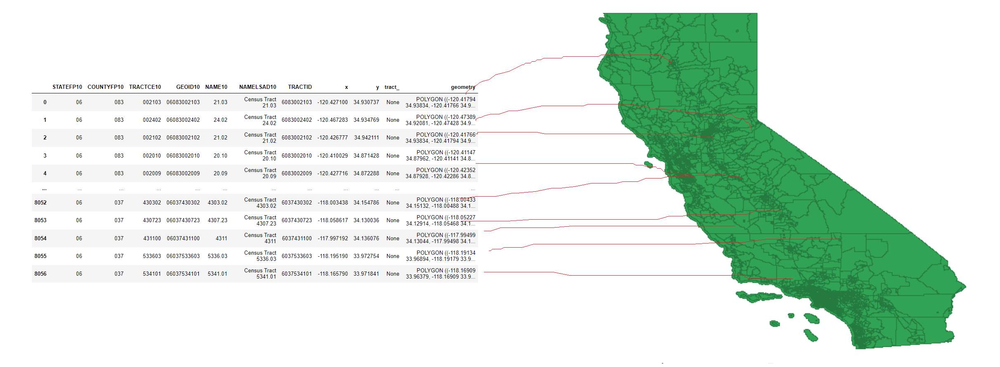

In order to do spatial analysis, you a shapefile. A shapefile is file that has spatial information and it can also information about each spatial unit. 

* So, the shapefile has a <b>visual component:</b>
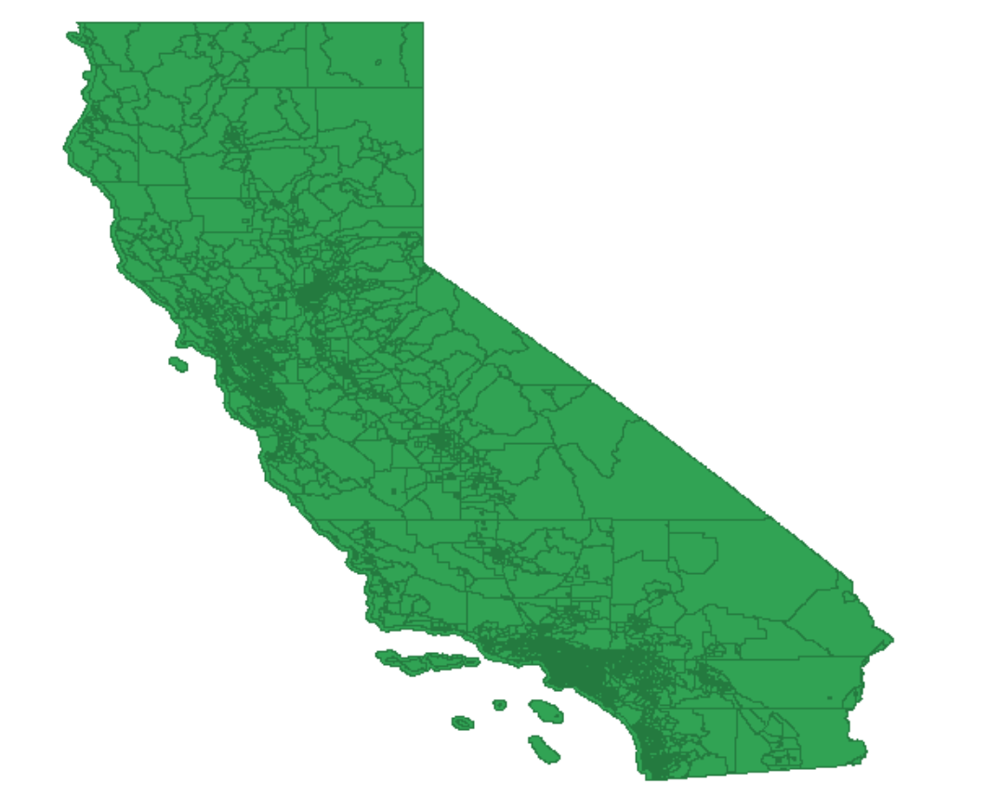

* The shapefile also has a <b>table component</b> too:
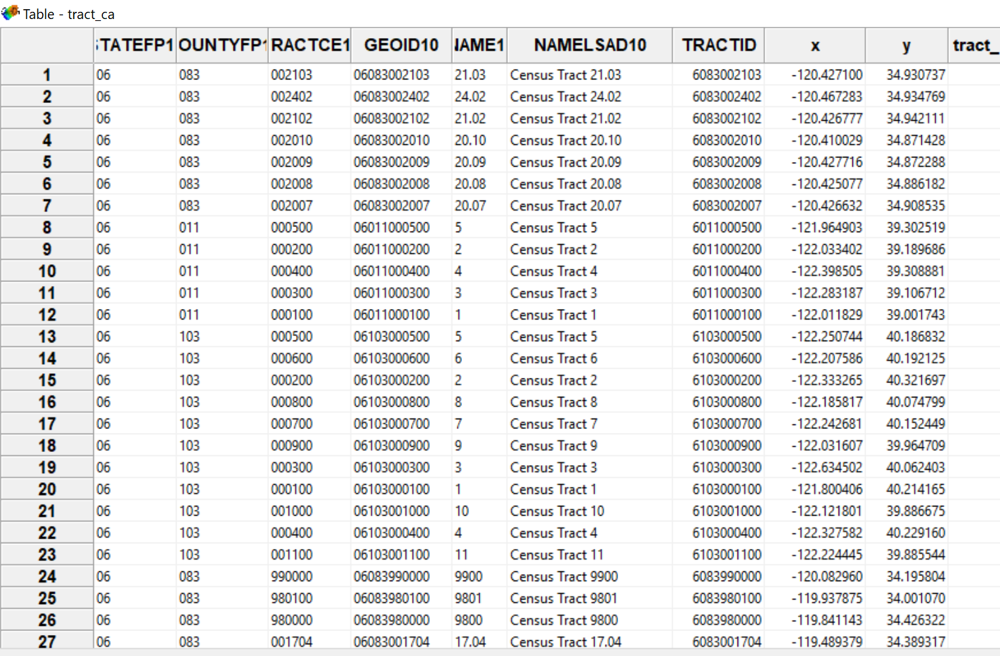

## Map Projections

Maps can be projected in different ways. Keep an eye for it. I am not going to talk too much about it here. Because the projection matter less for smaller location (like for example a specific city or specific county). Projections matter a lot more for larger studies (like the entire U.S.). All the examples we will be doing here are small locales. 

Below is a UTM projection is best used for small distances. I use this projection a lot. They have it for specific zones. So depending where your place is located determines which UTM zone.

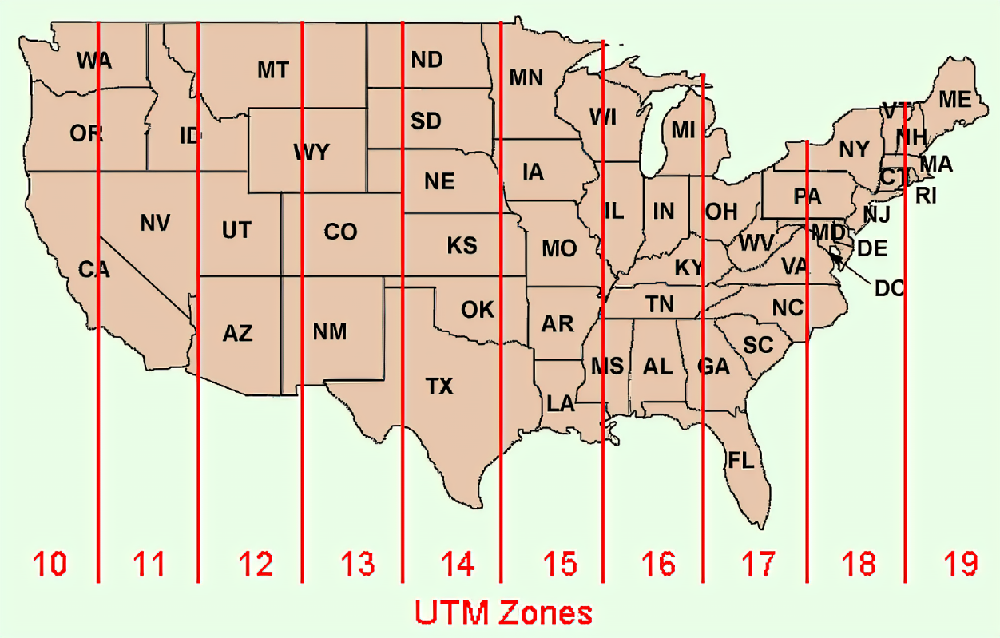

## GeoDa

Stata is quickly incorporating spatial analysis, however, I would say most quantitative research using spatial analysis in sociology uses GeoDa. GeoDa is FREE and is a graphic-user interface meaning it is a click-click program. 

When you open GeoDa, it looks like this:

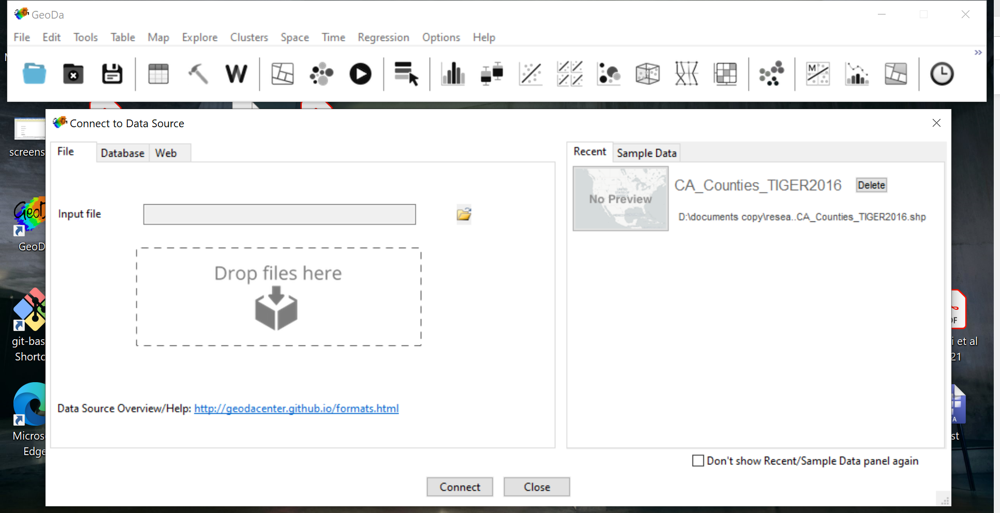

## Shapefiles aka map files
Shapefiles (.shp) are the file(s) that store the map. You <b>need</b> a shapefile in order to do spatial analysis. Depending on the geographical unit you are looking for, you can find shapefiles by searching google. For example, the U.S. Census publishes shapefiles for blocks, tracts, counties, and states.

Let's practice opening a shapefile in GeoDa.

* Download the "CA_Counties_zipped" folder from Catcourse. 
* Unzip  the folder and call it "CA_Counties"
* Save "CA_Counties" to the "week 7" folder in your SOC 211 folder.

### Opening shapefiles in GeoDa
Step 1: Open GeoDa.

Step 2: On the "Connect to Data Source" window. Click on the folder icon next to "Input file." The  click "ESRI Shapefile (.shp)"

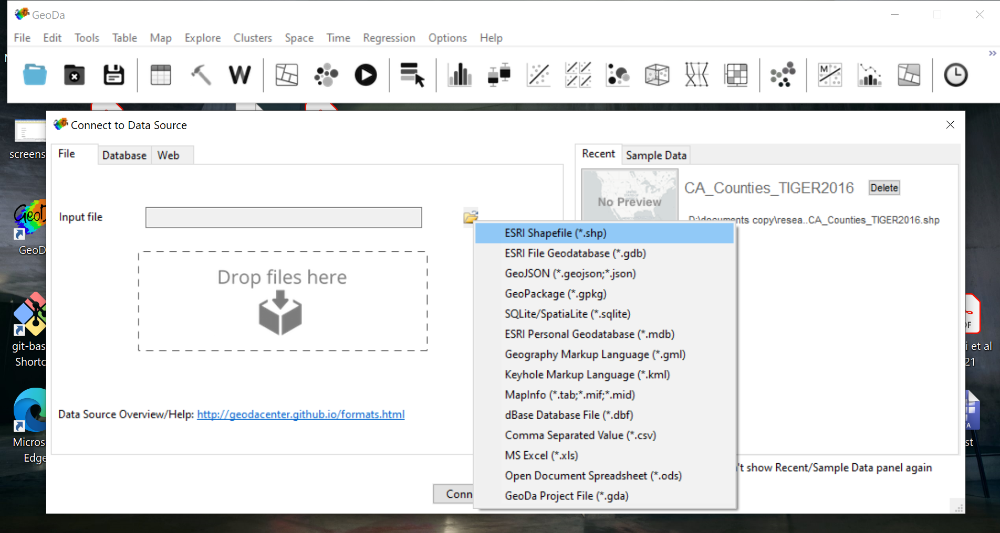

Step 3: A window will pop up, go to the "CA_Counties" in your "week 7" folder. Click "Open".

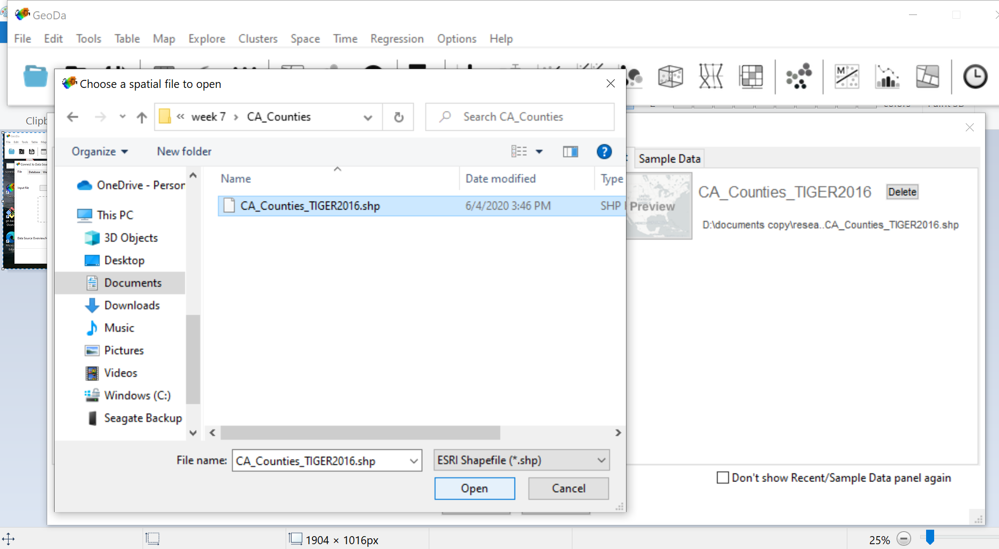

<b>A map of California should appear</b>
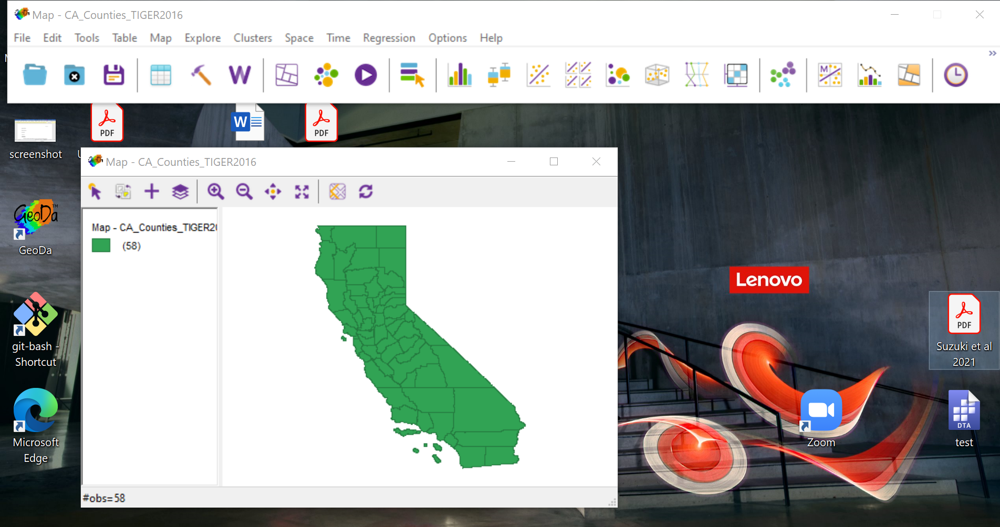

This is shapefile.

### Exploring the data within the shapefile.

Step 1: Click the table icon and the table of data will open.

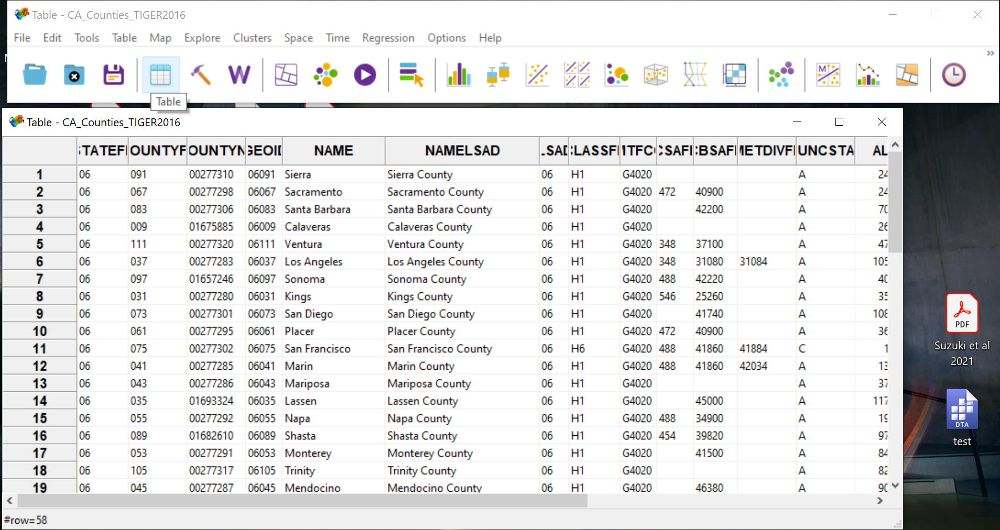

This shows you all the variables within the shapefile. Here is a brief description of some of the variables:
* STATEFP -- the fips code for the state (California's fips code i 06)
* FIPFP -- the fips code for the county (this is uniquely identified JUST within California)
* GEOID -- this is the state fips and county fips
* NAME -- name of the county

Unfortunately, this file doesn't have social variables like health or demographic statistics. We would have to merge health data or demographic data to this shapefile. You can merge excel or .csv data to a shapefile in GeoDa. (Table -> Merge) I will not be covering that here. If you are merging data for your project, please contact me and I can go through it with you.

NOTE: The <b> unit of analysis</b> of this table is counties.

## Spatial weights

In spatial analysis, we focus on controlling for spatial autocorrelation. We control for spatial autocorrelation by incorporating spatial weight matrix. Spatial analysis uses a matrix that show neighbors of units.

THE FIRST STEP TO ANY SPATIAL ANALYSIS IS TO CREATE/MAKE A SPATIAL WEIGHT

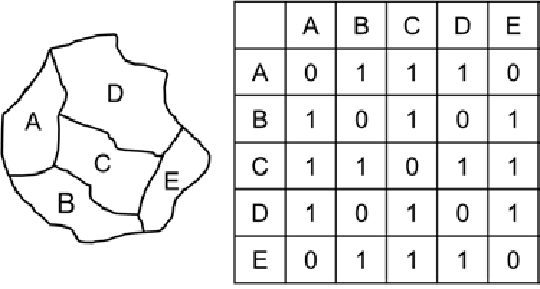

There are two main types of spatial weights:
* Contiguity-based spatial weight
* Distance-based spatial weight

## Contiguity-based spatial weights
Contiguity-based spatial weights are based on directly adjacent neighbors. 
* Rook weights includes neighbors who share a line boundary.
* Queen weight includes who are are a line and point boundaries.

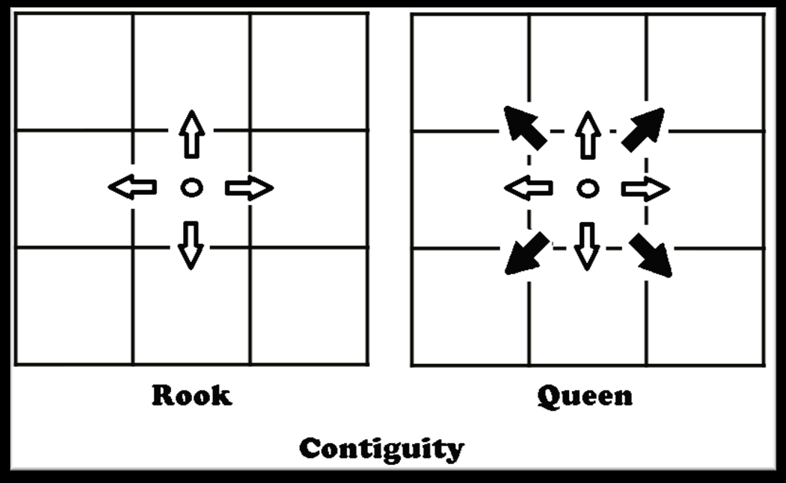

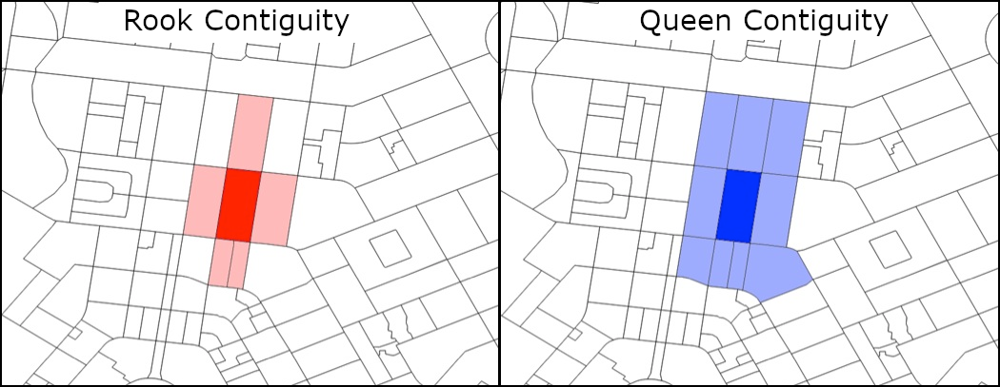

### Orders
You can "orders" to the contiguity-based weights. For example, a second order queen weight includes the neighbors of neighbors.

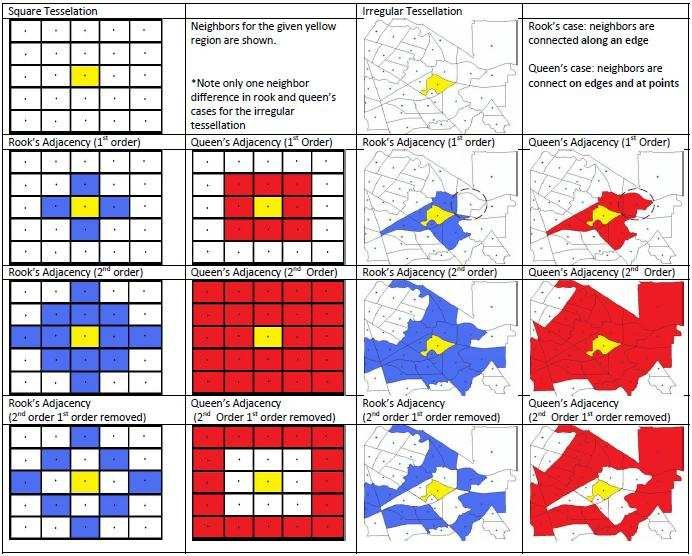


### Making Contiguity-based spatial weights in GeoDa.
(You must have a shapefile already loaded into GeoDa.)

Step 1: Click the Tools -> Weight Manager.

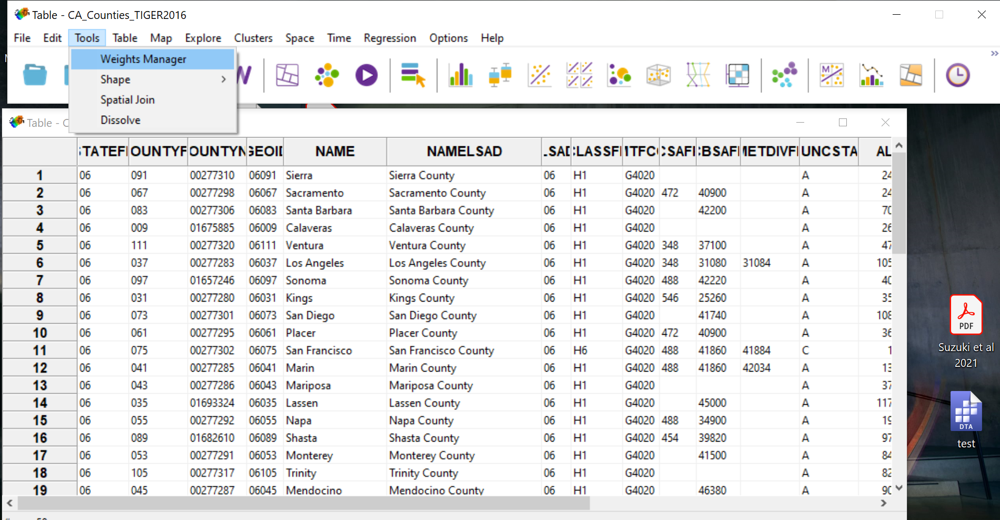

Step 2: In the "Weights Manager" window, click "Create"

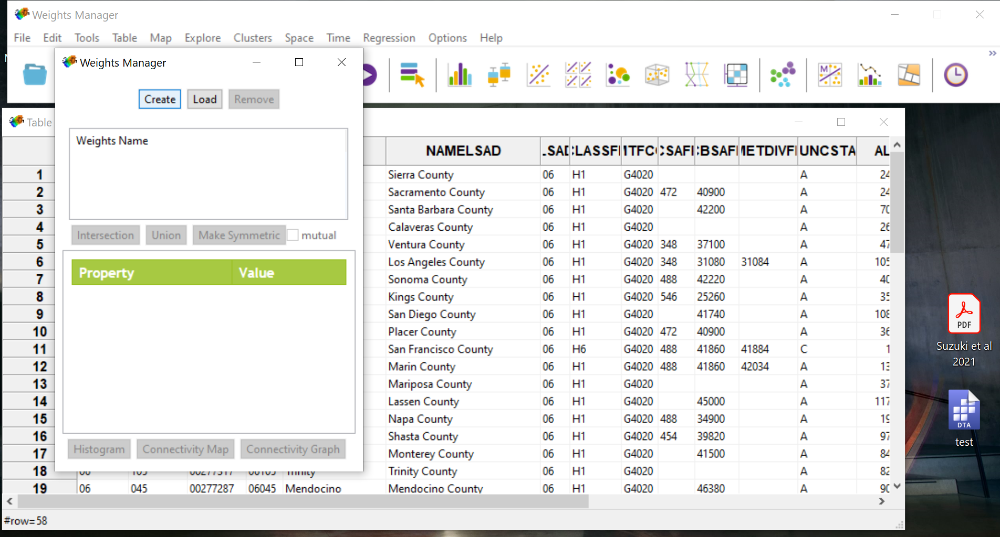

Step 3: In the "Weights File Creation" window, the "Select ID Variable" lists all the variable from the table of the shapefile. You must use a variable that uniquely identifies each observation. (Remember, for this shapefile the unit of analysis is county.) We are going to use GEOID as the ID variable. 

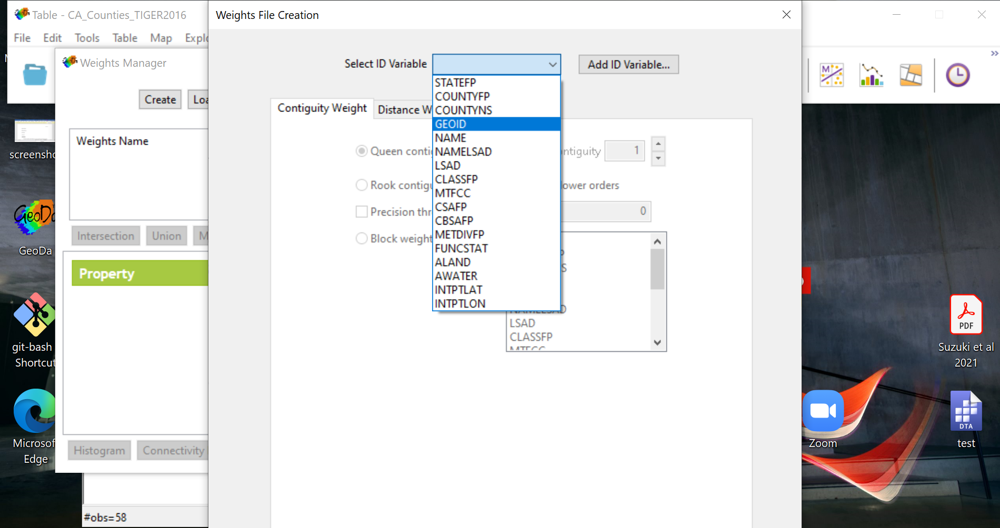

Step 4: We will make a first-order queen weight. We click "Queen contiguity" and Order of contiguity 1 and click "Create." A window asking you to save the spatial weight will appear. I recommend making a "spatial weights" folde in your "week 7" folder. 

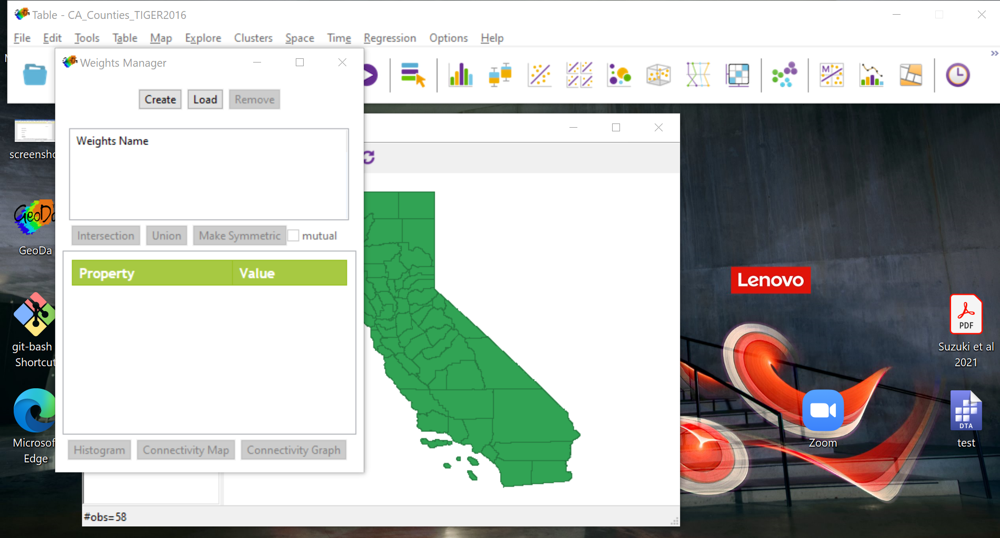

Step 5: The Weights Manager window has lots of information about the spatial weight. Explore the Hitogram and Connectivity Map options.

## Distance-based spatial weights
Distance-based spatial weights are based on distance. Here, projections does matter.

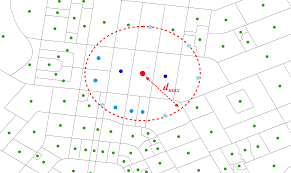

### Making Distance-based spatial weights in GeoDa.
Since we will be doing distance-based spatial weights, we will be using a small locale--Las Vegas. Open the Las Vegas shapefile. In this example, I have projected this shapefile to UTM zone 11. Each unit in this projection represents a 1 meter.

Step 1-3: Same as above.

Step 4: In the "Weights File Creation" window, click the "Distance Weight" tab. Our shapefile is projected in UTM zone 11, so we can use the "euclidean distance". Clicking this will automatically set the "specify bandwidth" to the minimum distance needed for each observation to have AT LEAST one neighbor.

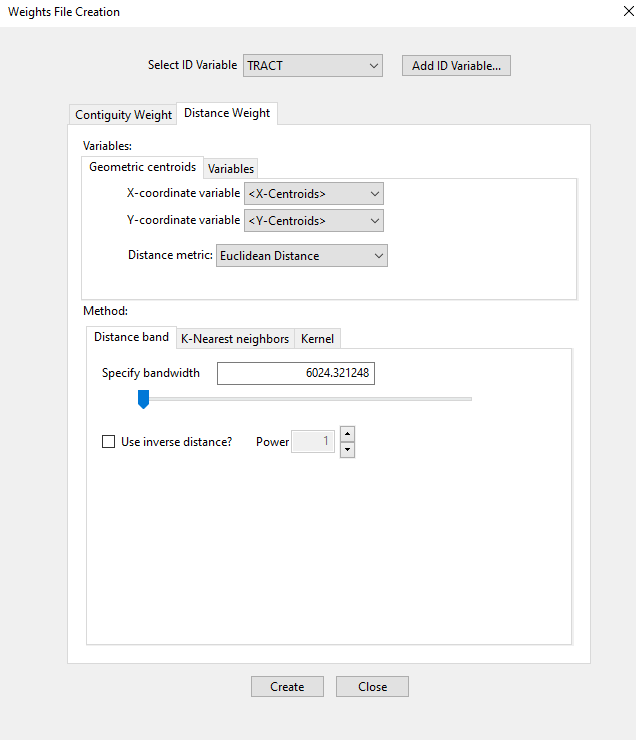

For example, let's set the bandwidth below 6025 meters to 5000 meters. Click Create and then "Yes." Name your spatial weight as "Distance_100000m"

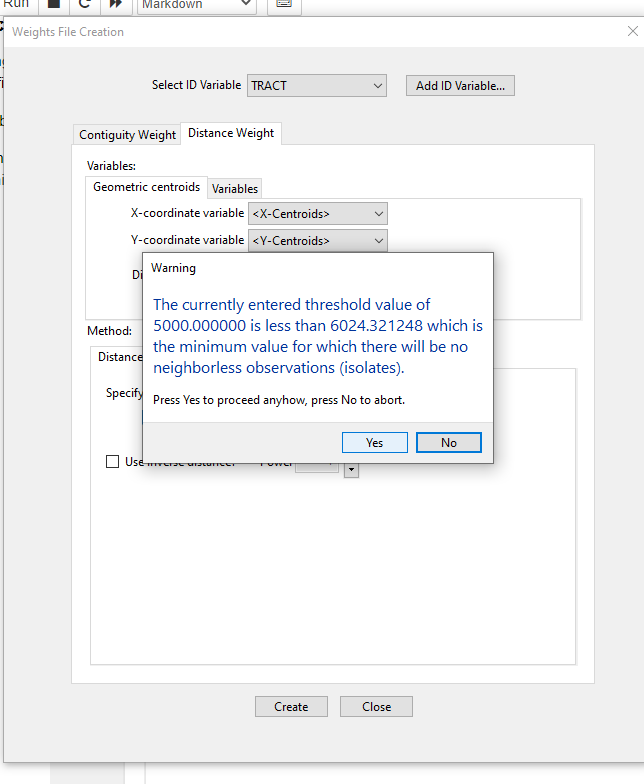

Go ahead and play around with the histogram and connectivity map.

<b>Pratice</b>

Using the Las Vegas shapefile as before...

* A: Make a second order rook spatial weight.
* B: Make a 3km distance spatial weight.

### How to know what spatial weight to choose?
This is going to come down to previous literature, theory, and statistical power.

## Moran's I
Moran's I is a test statistic of spatial autocorrelation; it measures spatial dependence--measures the amount of one place is similar to its neighbors. It is a correlation statistic so it ranges from -1 to 1, where numbers close to -1 or 1 mean spatial autocorrelation. Numbers closer to 0 mean less spatial autocorrelation. Moran's I is calculated based on a spatial weight, meaning you will get different Moran's I for different spatial weights.

<b>This is -1/1 spatial autocoreelation:</b>
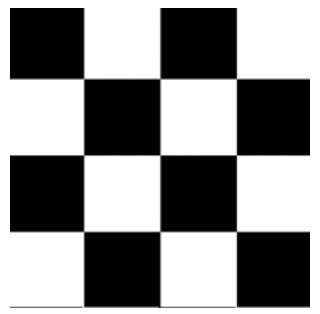

<b>This is closer numbers to 0; no spatial autocorrelation:</b>
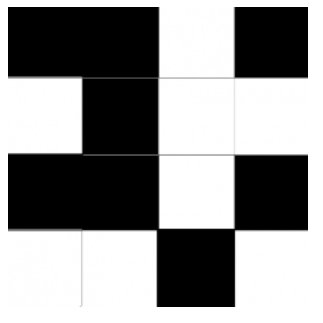

Assessing Moran's I statistical significance:

<b>Null hypothesis</b>

$ H_0 = $ spatial independence

Therefore, a statistically significant Moran's I means spatial autocorrelation.

GeoDa calculate Moran's I by going to Space -> Univariate Moran's I
Test the significance by right clicking and clicking Randomization and choosing 999 permutations. 

## Spatial regression
In OLS, we have assumptions such as normality, homoscedasticity, and independence. Well, when examining units spatially, you may have spatial autocorrelation. The purpose of spatial regression is the control for spatial dependence via the spatial weight in order to satistfy these assumptions. 

Once you choosen your spatial weight; then you can examine spatial autocorrelation. In spatial econometrics researchers use a series of tests including Lagrange Multiplier tests statistics to determine which spatial model to employ: spatial error or spatial lag. You can do this, but it is important to make these decisions based on previous research and theory. 

Two spatial autoregressive (SAR) models:
* spatial error model -- accounts for the influences of unmeasured independent variables by looking at the clustering of error terms
* spatial lag model -- uses a lagged dependent variable

The two models have similar mathematics but have slight differences. The spatial lag model uses a lagged dependent variable, whereas a spatial error model accounts for the influences of unmeasured independent variables by looking at the clustering of error terms.

## Spatial error model

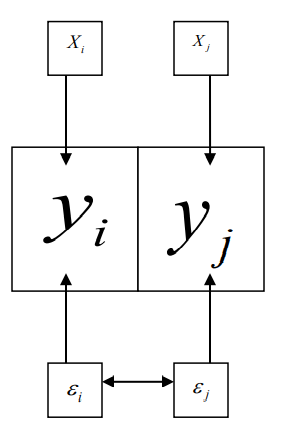
(Figure from: https://cga-download.hmdc.harvard.edu/publish_web/GIS_Institute/2018_summer/OpenGeoDa3_2018.pdf)

Spatial error model controls for spatial dependence in the errors, only. This is because the spatial error model implements the influences of unmeasued independent variables by clustering them with the error term. This is kinda saying that the spatial dependence is happening because of unobserved variables and b/c they are spatially dependent/clustered in the error term. The spatial dependence happens in the errors because of error in measurement or unobserved variables.

<center>$ y = X*\beta +u$
    
where,

$y$ is [nx1] vector of observations' outcome
    
$X$ is [nxk] matrix of independent variables with [kx1] vector $\beta$
    
$u=\theta*W*u+\epsilon$ is [nx1] vector

$\theta$ is spatial autoregressive parameter
    
$W$ is weights matrix
    
$\epsilon$ is error

## Spatial lag model
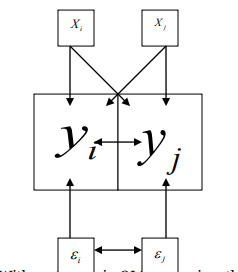

(Figure from: https://cga-download.hmdc.harvard.edu/publish_web/GIS_Institute/2018_summer/OpenGeoDa3_2018.pdf)

Spatial lag model uses a lagged dependent variable to account for spatial dependence. A spatial lag is basically like an average  of the value for the observation and its neighbors.

<center>$ y = \rho*W*y + X*\beta +u$
    
where
    
$y$ is [nx1] vector of observations' outcome
    
$W$ is [nxn] spatial lag operator
    
$W*y$ the spatial lag term
    
$\rho$ is the spatial autoregressive parameters
    
$X$ is [nxk] matrix of independent variables with [kx1] vector $\beta$
    
$u$ is [nx1] vector of errors

### Same as before, you should use previous research and theory inform your decision of what model to use. Luc Anselin outlines a way to determine which model to use (see the workbook or book I posted above for more information). Anselin follows the diagram below. For this class, I am going to be very specific of which model to estimate for.

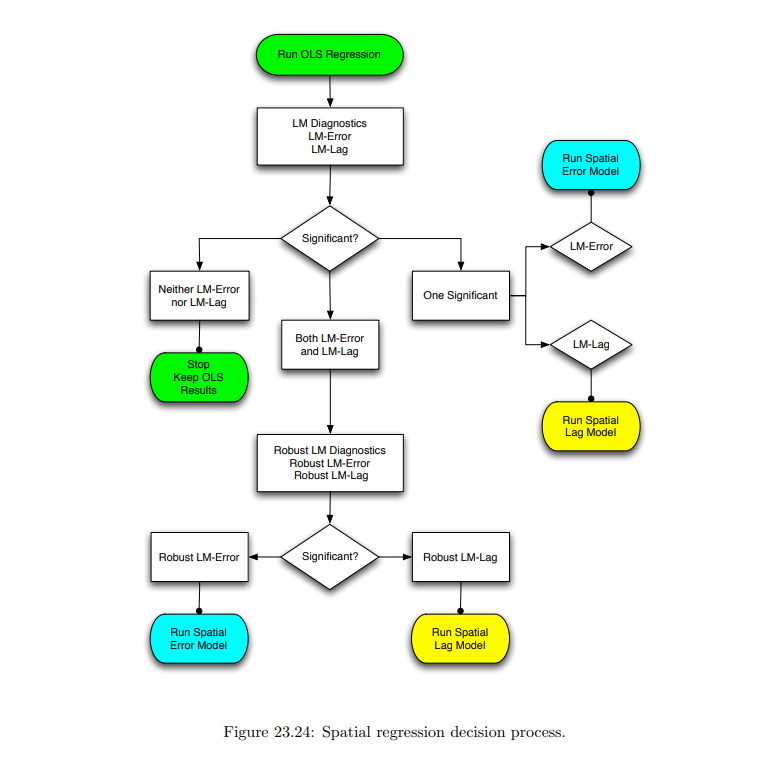

# Practice running spatial lag model

We will be running a spatial lag model predicting <b>estimated cancer risk from air toxics (cancerrisk) across the proportion of Latinx residents (latp), medhhinc_1m (median household income in $1,000s), and proportion of vacant houses (vacantp).</b>

Step 1: Open the Las Vegas shapefile from catcourse in GeoDa.

Step 2: Need to make a spatial weight. Here we will make first order queen weight. Check the "Connectivity Map" to check it is correct.

Step 3: Go to Regression in the main menu and click "Regression. We will first run a OLS regression.

Step 4: Next we will estimate spatial lag model. Click "cancerrisk" and use ">" command to add it as the Dependent Variable. Click "latp" and use the ">" to add it as the Covariates. Repeat for other independent variables.

Step 5: Check the box next to "Weight File" make sure the approriate weight it choosen.

Step 7: Click "Spatial Lag" for the spatial lag model. Also check the "Red. Val and Res" option.

Step 8: Click "Run" to estimate your model.

A window should pop up with your regression results.

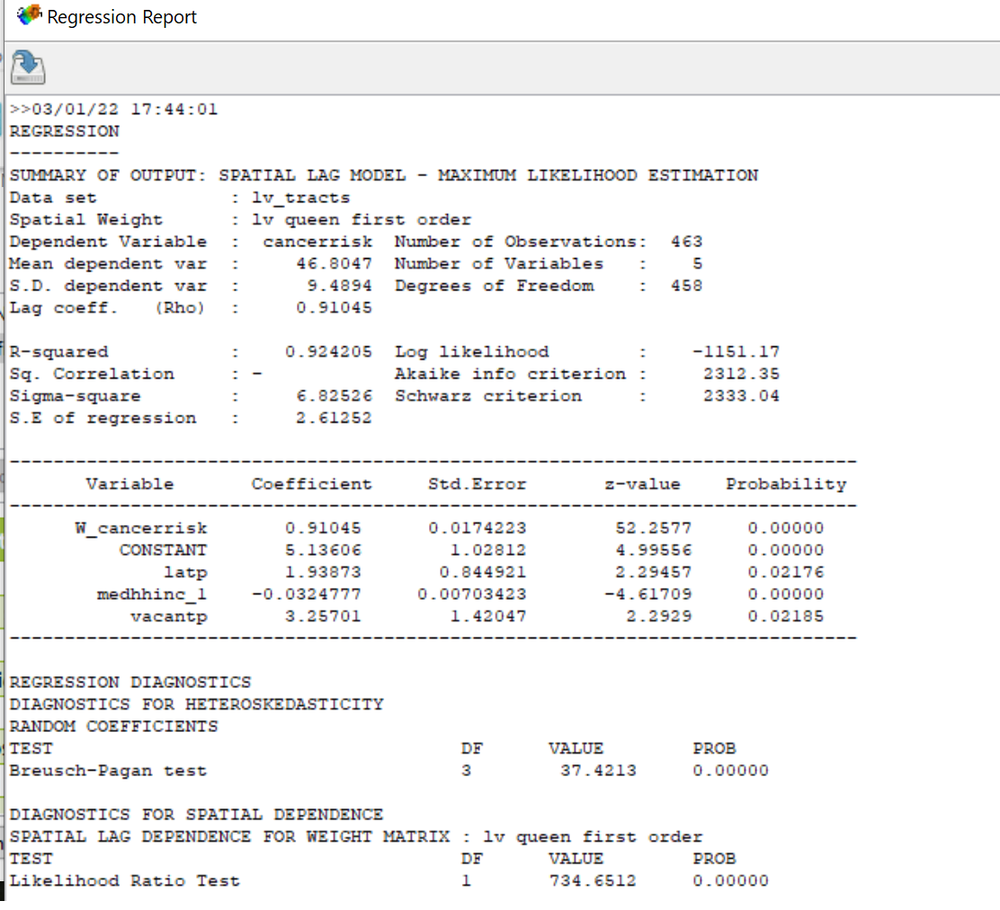

<b>coefficent estimates interpretation</b>

Here, we find that percent of latinx resident is positive and significant thus meaning, as proportion of Latinx residents increases in census tracts there is a significant corresponding increase in estimated cancer risk from air toxics. Median household income is negative and significant thus: as median household income increases there is a significant decrease in estimated cancer risk from air toxics. Additionally, we find as proportion of vacant housing increases there is a significant increase in estimated cancer risk from air toxics. 

W_cancerrisk is the spatial lag (remember from the equation!). It tells us whether the average influence of the neighbors. Positive values neighbors influence positive outcome; negative value neighbors influence neagtive outcome.

A good habit with spatial analysis is to check moran's I of the residuals of the model. (That's why we "checked" pred errors and residuals box earlier.)

You can do by clicking out of the results window and click "Save to Table" on the Regression window. Click Okay to the window that pops up

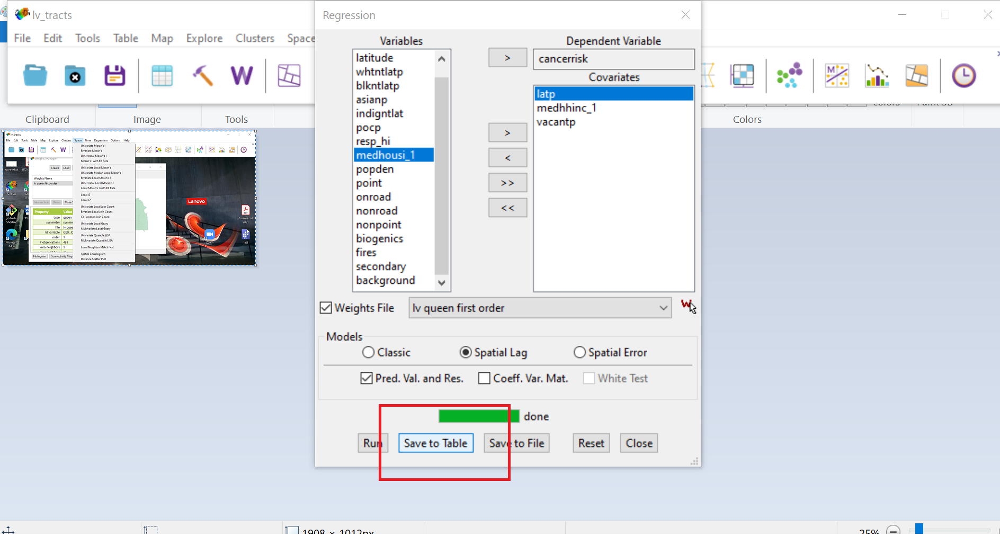

Click out of the regression window. Click Space -> Univariate Moran's I

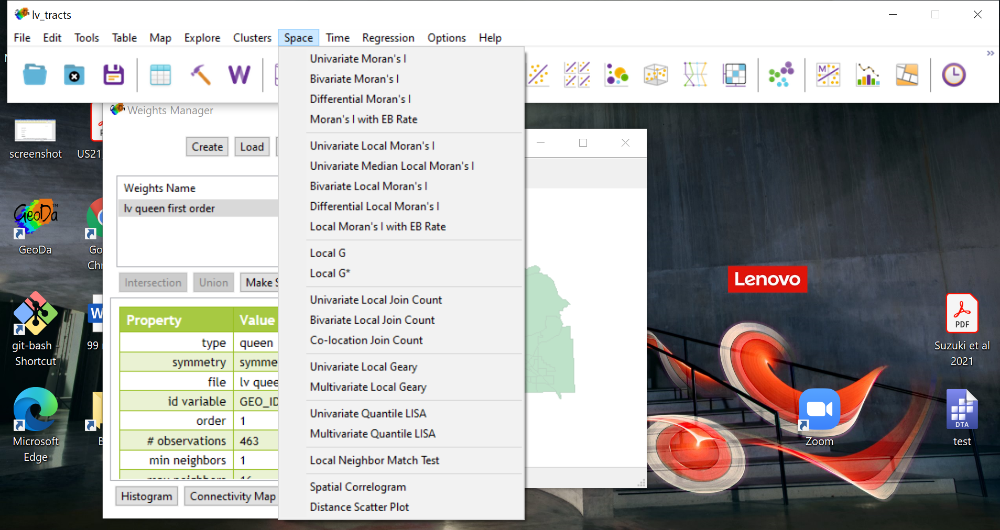

Click the "LAG_RESIDU" and press Okay. (make sure you use the same weight from the model)

Right-click and click Randomization -> 999 permutations

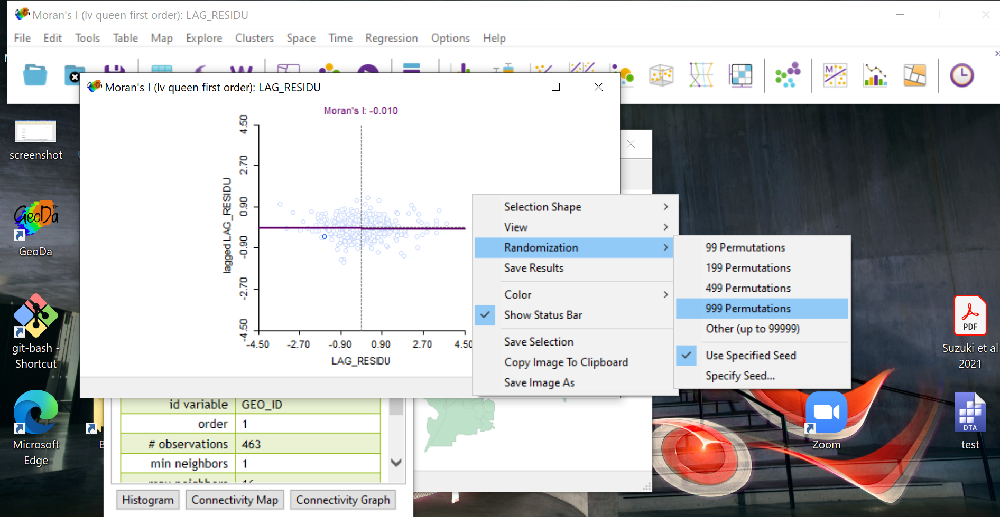

A window will pop up. If the p-value is significant that means the residuals of the model we just ran are spatial dependent (that is a bad thing). If the p-value is non-significant that means the residuals of the model are no spatially dependent (that's a good thing). We can add this to our results write-up.

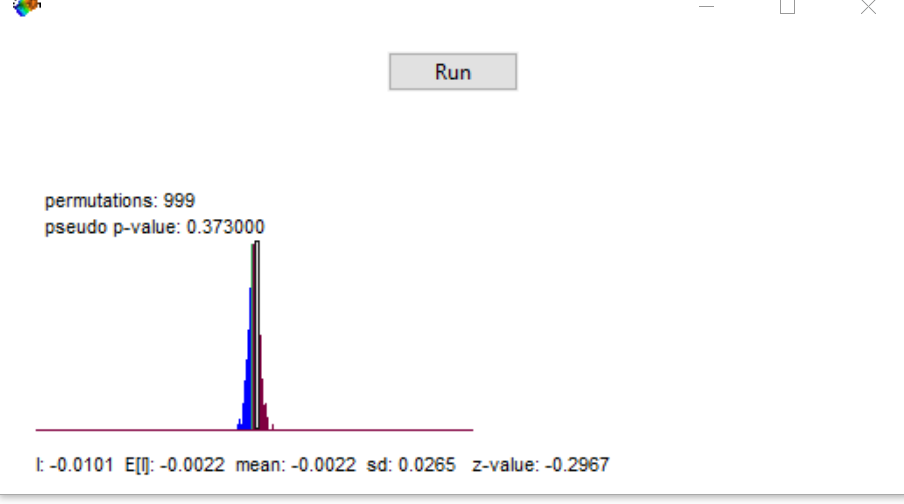

## Practice running spatial error model

We will be running a spatial error model predicting estimated cancer risk from air toxics across the proportion of Latinx residents, medhhinc_1m, and proportion of vacant houses.

Execpt pick "Spatial Error" on the window.

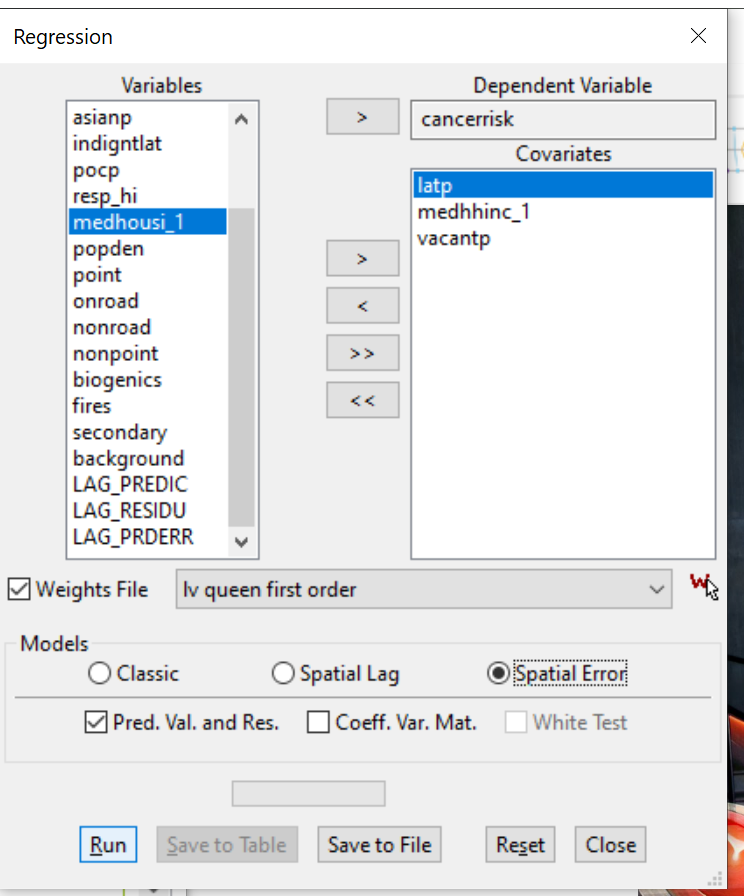



We have our spatial error model results:

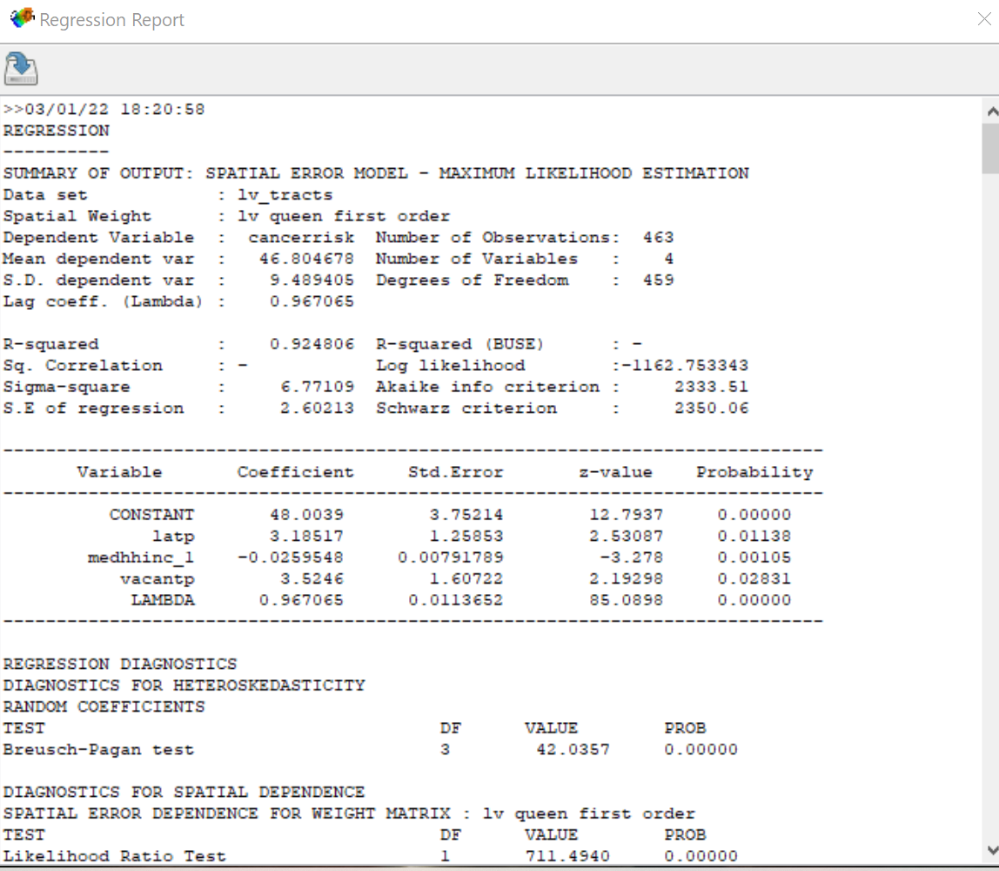

<b>coefficent estimates interpretation</b>

Our results are similar to the spatial lag model: We find that percent of latinx resident is positive and significant thus meaning, as proportion of Latinx residents increases in census tracts there is a significant corresponding increase in estimated cancer risk from air toxics. Median household income is negative and significant thus: as median household income increases there is a significant decrease in estimated cancer risk from air toxics. Additionally, we find as proportion of vacant housing increases there is a significant increase in estimated cancer risk from air toxics. 

Lambda is the spatially correlated errors.

Let's check the residuals. We find there is no spatial dependence in the residuals.

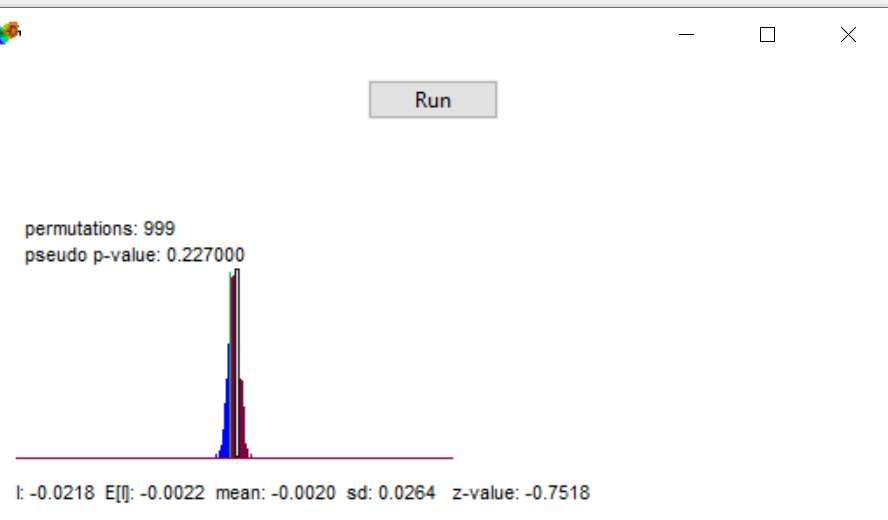

### Practice:

<b>Problem 1</b>

Using the Fresno CalEnviroScreen (CES) data, run a spatial lag model with 3km distance weight:

(Pesticides) = constant + (Education) + (Linguistic) + (Poverty) + (Unemployme) + (Housing Bu)

Are the residuals spatially autocorrelated (aka Moran's I=0)?

Interpret the coefficient estimates. 

<b>Problem 2</b>

Using the Fresno CalEnviroScreen (CES) data, run a spatial error model with first-order queen weight:

(Lead) = constant + (Education) + (Linguistic) + (Poverty) + (Unemployme) + (Housing Bu)

Interpret the coefficient estimates. 

Data codebook

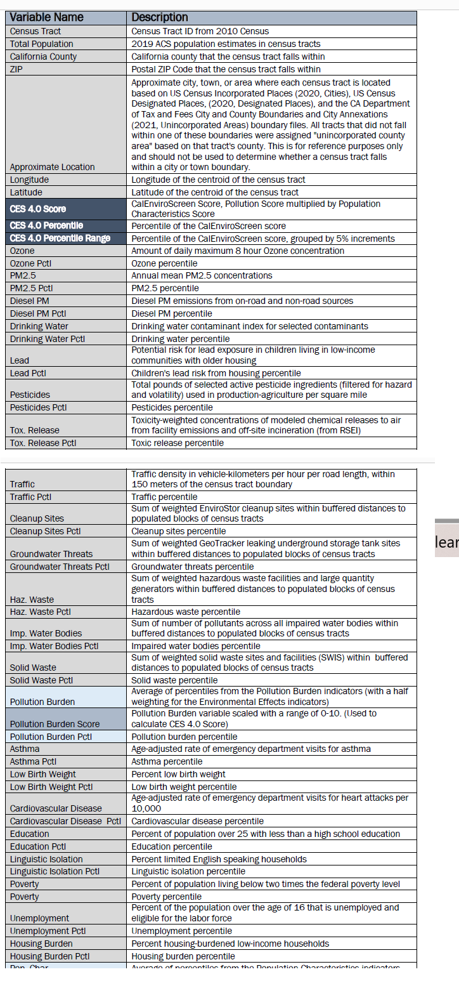